![](logo_scanpy.svg){width=50% fig-align="center"}


공간 전사체 분석은 종양 연구에서 매우 중요한데 종양 미세환경 내의 세포들(종양 세포, 면역세포, 혈관세포 등)과 그들의 상호작용을 이해하는 데 도움이 되기 때문입니다. 특히 공간에서 일어나는 유전자 발현 패턴이 특정 치료제나 면역 치료에 대한 반응성을 예측할 수 있다고 믿어지기 때문에 더욱 더 중요해지고 있습니다. 이번 글에서는 공간 전사체(이하 Visium)데이터와 scRNA-seq 데이터를 결합하는 방법을 위주로 살펴보겠습니다.

# 들어가며

이 튜토리얼은 [Giovanni Palla](https://scanpy-tutorials.readthedocs.io/en/latest/spatial/integration-scanorama.html) 및 [Carlos Talavera-López](https://docs.scvi-tools.org/en/latest/tutorials/notebooks/stereoscope_heart_LV_tutorial.html)의 튜토리얼을 각색한 것입니다. `Visium` 데이터는 여러 면에서 scRNAseq 데이터와 비슷한 형태를 띄고 있습니다. 다만 5~20개 세포가 하나의 UMI 카운트를 의미해서 단일 세포 수준이 아니고 조직 내 공간적 위치에 대한 추가 정보가 있다는 차이가 있습니다. 여기서는 `Visium` 데이터 QC를 진행하고 필터링, 차원 축소, 통합 및 클러스터링을 수행해봅니다. 그런 다음 마우스 뇌의 scRNAseq 데이터를 레퍼런스로 사용해 세포 유형을 예측해봅니다.


여기서 사용한 데이터는 [10xGenomics](https://support.10xgenomics.com/spatial-gene-expression/datasets/)에 공개한 마우스 뇌의 `Visium` 데이터셋 입니다. 먼저, 필요한 라이브러리를 불러옵니다.

:::{.callout-note}

예시 데이터셋은 이미 조직과 겹치지 않는 부분은 필터링이 완료된 상태입니다. 실제 데이터에서 진행한다면 추가 필터링 작업이 필요합니다.

:::


In [2]:
import os
import pickle
import warnings

warnings.filterwarnings("ignore", message=".*IProgress not found.*")

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanorama
import scanpy as sc
from scvi.external import RNAStereoscope, SpatialStereoscope

# 경고 무시하기
warnings.filterwarnings("ignore")

plt.style.use("classic")
sc.settings.n_jobs = -1
sc.settings.verbosity = 0  # 오류 (0), 경고 (1), 정보 (2), 힌트 (3)
sc.settings.set_figure_params(
    dpi=60, frameon=False, figsize=(3, 3), facecolor="white", color_map="viridis_r"
)
print(f"사용한 SCANPY 버전: {sc.__version__}")

사용한 SCANPY 버전: 1.10.1


# 데이터 불러오기

데이터를 불러오기 위해 `datasets.visium_sge()` 함수로 `10xgenomics` 데이터셋을 가져오겠습니다. 만약에 직접 수집한 `Visium` 데이터를 사용하는 경우 `Scanpy`의 `read_visium()` 함수를 사용해야 합니다. 그리고 `pp.calculate_qc_metrics()`함수를 사용해 표준 QC 평가 지표를 계산하겠습니다. 

In [3]:
# 누락되거나 계산 시간이 오래 걸리는 경우 미리 계산된 데이터 다운로드
fetch_data = True

# url for source data
path_data = "https://export.uppmax.uu.se/naiss2023-23-3/workshops/workshop-scrnaseq"

if not os.path.exists("./input/spatial/visium"):
    os.makedirs("./input/spatial/visium")

adata_anterior = sc.datasets.visium_sge(sample_id="V1_Mouse_Brain_Sagittal_Anterior")
adata_posterior = sc.datasets.visium_sge(sample_id="V1_Mouse_Brain_Sagittal_Posterior")

adata_anterior.var_names_make_unique()
adata_posterior.var_names_make_unique()

# 하나의 데이터 집합으로 병합
library_names = [
    "V1_Mouse_Brain_Sagittal_Anterior",
    "V1_Mouse_Brain_Sagittal_Posterior",
]

adata = adata_anterior.concatenate(
    adata_posterior,
    batch_key="library_id",
    uns_merge="unique",
    batch_categories=library_names,
)

adata

AnnData object with n_obs × n_vars = 6050 × 32285
    obs: 'in_tissue', 'array_row', 'array_col', 'library_id'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

병합된 객체에 두 이미지가 모두 포함되도록 `uns_merge="unique"` 옵션을 사용합니다. 그러면 공간 정보는 `obsm`에 저장됩니다.

# 데이터 품질 관리

scRNA-seq와 마찬가지로 품질 관리를 위해 개수, 특징 수 및 미토콘드리아 비율에 대한 통계를 사용합니다.

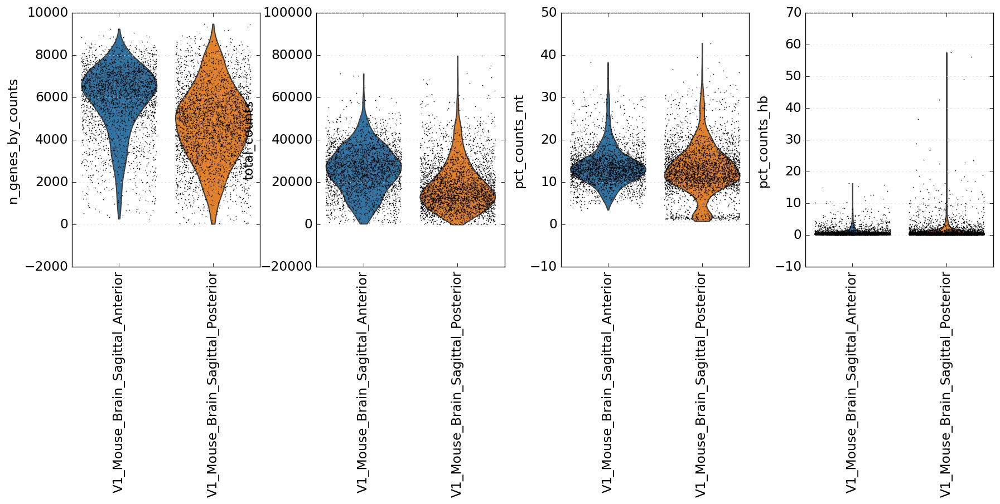

In [4]:
# 미토콘드리아 및 헤모글로빈 유전자에 대한 정보를 개체에 추가합니다.
adata.var["mt"] = adata.var_names.str.startswith("mt-")
adata.var["hb"] = adata.var_names.str.contains("^Hb.*-")

sc.pp.calculate_qc_metrics(adata, qc_vars=["mt", "hb"], percent_top=None, log1p=False, inplace=True)

with plt.rc_context({"figure.figsize": (4, 5)}):
    sc.pl.violin(
        adata,
        ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_hb"],
        jitter=0.4,
        groupby="library_id",
        rotation=90,
    )

V1_Mouse_Brain_Sagittal_Anterior


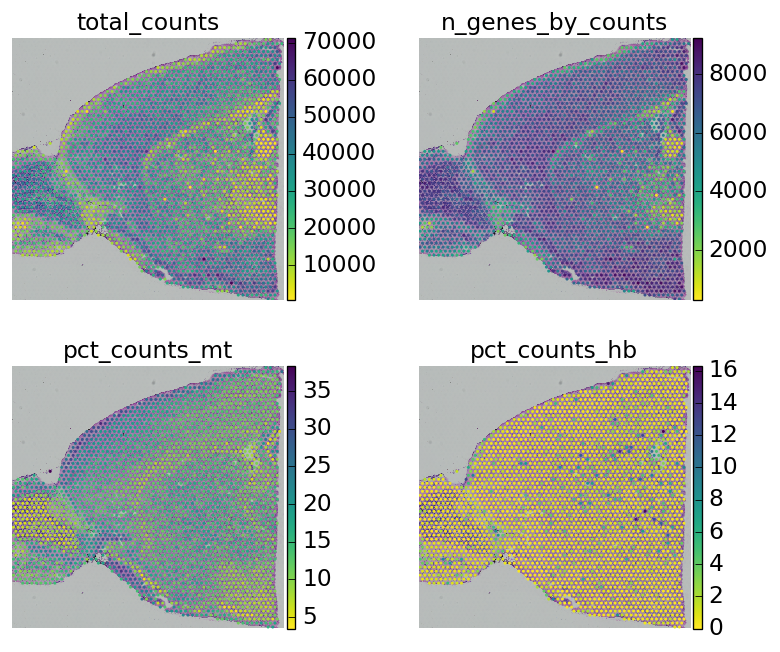

V1_Mouse_Brain_Sagittal_Posterior


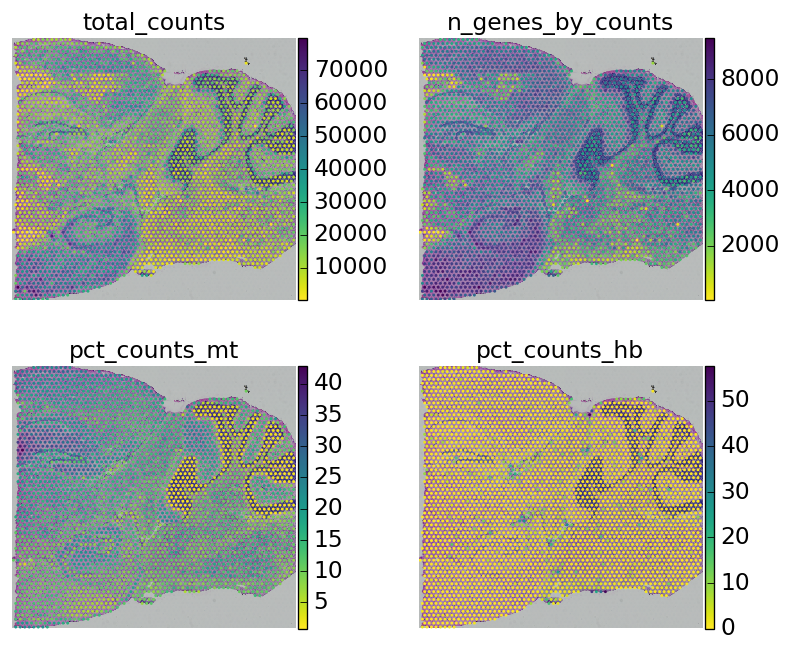

In [5]:
# 두 섹션을 별도로 시각화 하려면 library_id를 지정합니다.
for library in library_names:
    print(library)
    sc.pl.spatial(
        adata[adata.obs.library_id == library, :],
        library_id=library,
        color=["total_counts", "n_genes_by_counts", "pct_counts_mt", "pct_counts_hb"],
        ncols=2,
    )

보시다시피, 개수/특징이 적고 미토콘드리아 함량이 높은 부분은 주로 조직의 가장자리 쪽에 있습니다. 이러한 영역은 손상된 조직일 가능성이 높습니다. 섹션에 찢어지거나 접힌 부분이 있는 경우 품질이 낮은 조직 내 영역이 보일 수도 있습니다.

그러나 일부 조직 유형에서는 발현된 유전자의 양과 미토콘드리아의 비율도 생물학적 의미를 가지고 있을 수 있기 때문에 작업 중인 조직과 이러한 특징이 어떤의미인지 생각해 두어야 합니다.

## 스팟 필터링

미토콘드리아 판독률이 25% 미만이고 헤모글로빈(`hb`) 판독률이 20% 미만 그리고 검출된 유전자가 1,000개 이상인 모든 스팟을 선택합니다. 데이터에 적합한 필터링 기준은 사전 지식을 바탕으로 직접 판단해야 합니다.

In [6]:
keep = (
    (adata.obs["pct_counts_hb"] < 20)
    & (adata.obs["pct_counts_mt"] < 25)
    & (adata.obs["n_genes_by_counts"] > 1000)
)
print(sum(keep))

adata = adata[keep, :]

5749


필터링한 결과에 대한 조직 절편을 다시 시각화 합니다.

V1_Mouse_Brain_Sagittal_Anterior


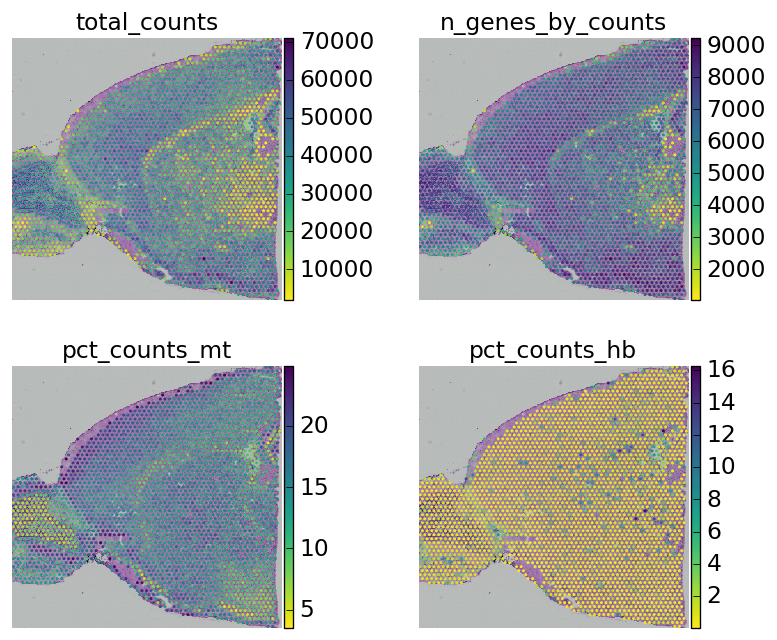

V1_Mouse_Brain_Sagittal_Posterior


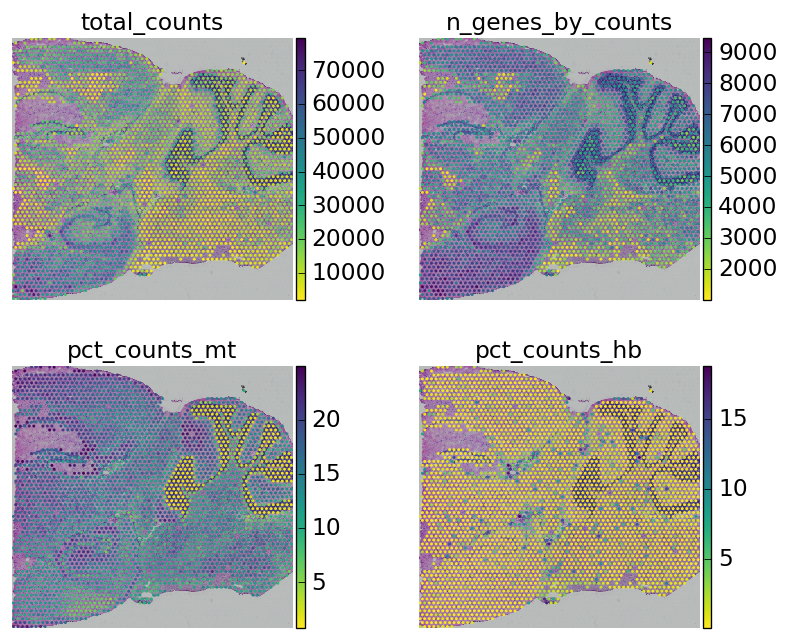

In [7]:
for library in library_names:
    print(library)
    sc.pl.spatial(
        adata[adata.obs.library_id == library, :],
        library_id=library,
        color=["total_counts", "n_genes_by_counts", "pct_counts_mt", "pct_counts_hb"],
        ncols=2,
    )

## 많이 발현되는 유전자 확인

데이터에서 가장 많이 발현되는 유전자가 무엇인지 살펴보겠습니다.

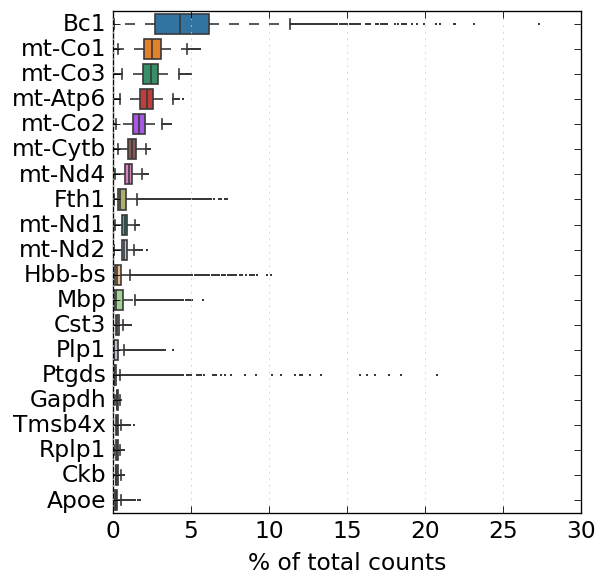

In [8]:
with plt.rc_context({"figure.figsize": (5, 4)}):
    sc.pl.highest_expr_genes(adata, n_top=20)

위 시각화 결과에서 알 수 있듯이 미토콘드리아 유전자는 가장 많이 발현되는 유전자 중 하나입니다. 또한 `lncRNA`,`Bc1`(Brain cytoplasmic RNA1)도 많이 발현됩니다.

## 유전자 필터링하기

데이터에서 `Bc1` 유전자, 헤모글로빈 유전자(혈액 오염), 미토콘드리아 유전자를 제거합니다.

In [9]:
mito_genes = adata.var_names.str.startswith("mt-")
hb_genes = adata.var_names.str.contains("^Hb.*-")

remove = np.add(mito_genes, hb_genes)
remove[adata.var_names == "Bc1"] = True
keep = np.invert(remove)
print(f"제거되는 데이터의 갯수: {sum(remove)}")

adata = adata[:, keep]

제거되는 데이터의 갯수: 22


# 분석하기

섹션이 두 개이므로 `batch_key="library_id"`로 가변 유전자를 선택한 다음 추가 분석을 위해 가변 유전자의 조합을 가져옵니다. 이 방법은 분석에 특정 배치의 유전자가 편향적으로 포함되지 않게 하기 위함입니다.

In [10]:
# 나중을 위해 원시 데이터 카운트를 별도의 객체에 저장
counts_adata = adata.copy()

sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
# 배치당 1500개의 가변 유전자를 가져온 다음 이들의 조합을 사용합니다.
sc.pp.highly_variable_genes(
    adata, flavor="seurat", n_top_genes=1500, inplace=True, batch_key="library_id"
)

adata.raw = adata
# 가변 유전자에 대한 하위 집합
adata = adata[:, adata.var.highly_variable_nbatches > 0]

# 데이터 스케일링
sc.pp.scale(adata)

이제 개별 유전자의 유전자 발현을 플로팅할 수 있는데, `Hpca` 유전자는 해마 조직을 나타내는 마커 유전자이고 `Ttr` 유전자는 맥락막 신경총(Choroid plexus)의 마커 유전자입니다.

V1_Mouse_Brain_Sagittal_Anterior


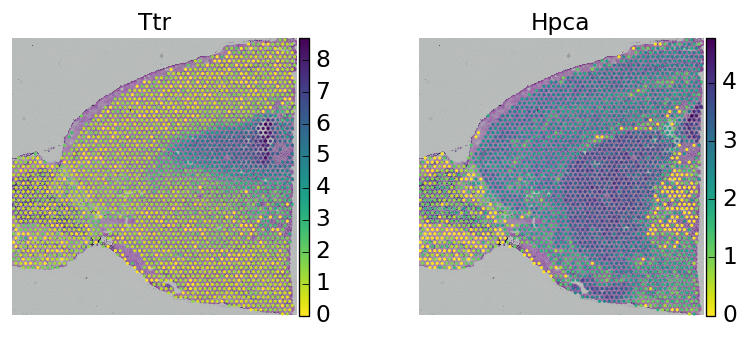

V1_Mouse_Brain_Sagittal_Posterior


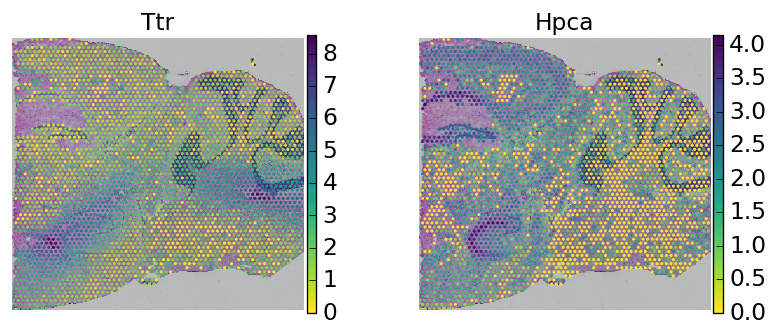

In [11]:
for library in library_names:
    print(library)
    sc.pl.spatial(
        adata[adata.obs.library_id == library, :],
        library_id=library,
        color=["Ttr", "Hpca"],
        ncols=2,
    )

# 비통합 클러스터링 (Non-integrated Clustering)

각 데이터셋을 독립적으로 분석한 후 클러스터링을 수행합니다. scRNA-seq 분석법과 동일한 방법으로 차원 축소 및 클러스터링을 진행합니다.

In [12]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

이제 UMAP으로 클러스터와 `library_id`를 시각화해봅니다.

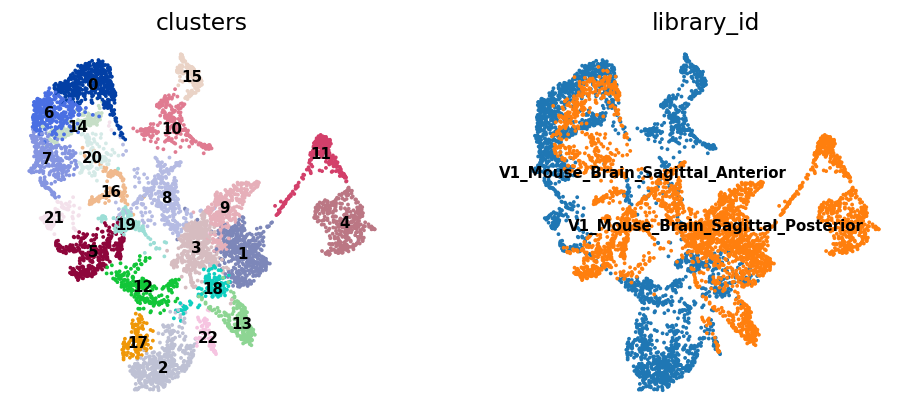

In [13]:
with plt.rc_context({"figure.figsize": (4, 4)}):
    sc.pl.umap(
        adata,
        color=["clusters", "library_id"],
        legend_loc="on data",
        legend_fontsize="9",
        ncols=2,
    )

조직 섹션에 클러스터를 시각화하기 위해 데이터에서 클러스터 색상을 가져와 동일한 색상으로 지정해야 합니다.

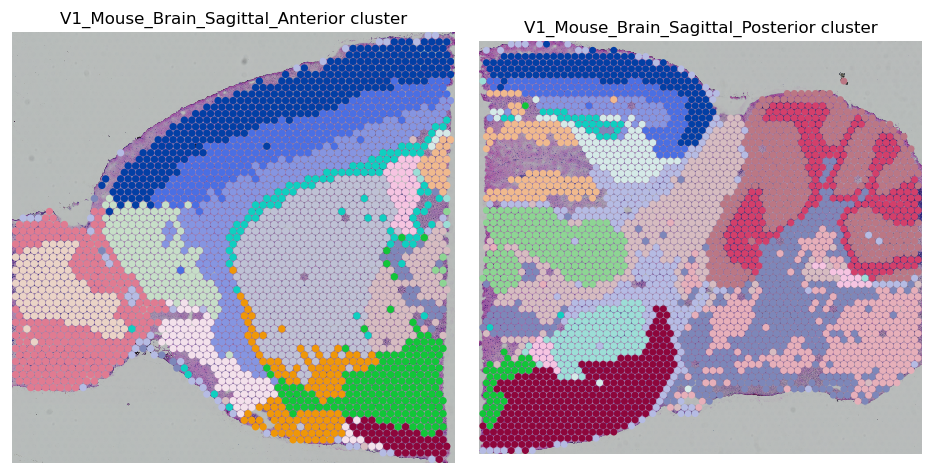

In [14]:
clusters_colors = dict(
    zip(
        [str(i) for i in range(len(adata.obs.clusters.cat.categories))],
        adata.uns["clusters_colors"],
    )
)
fig, axs = plt.subplots(1, 2, figsize=(8, 8))

for i, library in enumerate(library_names):
    ad = adata[adata.obs.library_id == library, :].copy()
    sc.pl.spatial(
        ad,
        img_key="hires",
        library_id=library,
        color="clusters",
        size=1.5,
        palette=[v for k, v in clusters_colors.items() if k in ad.obs.clusters.unique().tolist()],
        legend_loc=None,
        show=False,
        ax=axs[i],
    )
    axs[i].set_title(f"{library} cluster", fontsize=10)

plt.tight_layout()

# 통합 클러스터링 (Integrated Clustering)

 데이터셋을 하나로 통합한 후 클러스터링을 수행하는 방법입니다. 서로 다른 실험 조건이나 샘플에서 얻은 데이터를 함께 분석하여 전체적인 구조를 파악합니다. 서로 다른 조직 섹션 간에 강력한 배치 효과가 있는 경우가 많으므로 일반적으로 통합 클러스터링이 권장됩니다. 여기서는 통합을 위해 `Scanorama`를 사용해 진행하겠습니다.

In [15]:
adatas = {}
for batch in library_names:
    adatas[batch] = adata[adata.obs["library_id"] == batch,]

adatas

{'V1_Mouse_Brain_Sagittal_Anterior': View of AnnData object with n_obs × n_vars = 2597 × 2405
     obs: 'in_tissue', 'array_row', 'array_col', 'library_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'pct_counts_hb', 'clusters'
     var: 'gene_ids', 'feature_types', 'genome', 'mt', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
     uns: 'spatial', 'library_id_colors', 'log1p', 'hvg', 'neighbors', 'umap', 'clusters', 'clusters_colors'
     obsm: 'spatial', 'X_pca', 'X_umap'
     obsp: 'distances', 'connectivities',
 'V1_Mouse_Brain_Sagittal_Posterior': View of AnnData object with n_obs × n_vars = 3152 × 2405
     obs: 'in_tissue', 'array_row', 'array_col', 'library_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'pct_co

In [16]:
# AnnData 객체 목록으로 변환
adatas = list(adatas.values())

# scanorama.integrate 실행
scanorama.integrate_scanpy(adatas, dimred=50)

# 모든 통합 행렬을 가져옵니다.
scanorama_int = [ad.obsm["X_scanorama"] for ad in adatas]

# 하나의 행렬로 만듭니다.
all_s = np.concatenate(scanorama_int)
# print(all_s.shape)

# AnnData 객체에 추가합니다.
adata.obsm["Scanorama"] = all_s

adata

Found 2405 genes among all datasets
[[0.         0.47824413]
 [0.         0.        ]]
Processing datasets (0, 1)


AnnData object with n_obs × n_vars = 5749 × 2405
    obs: 'in_tissue', 'array_row', 'array_col', 'library_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'pct_counts_hb', 'clusters'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'spatial', 'library_id_colors', 'log1p', 'hvg', 'neighbors', 'umap', 'clusters', 'clusters_colors'
    obsm: 'spatial', 'X_pca', 'X_umap', 'Scanorama'
    obsp: 'distances', 'connectivities'

그런 다음 다시 차원 축소 및 클러스터링을 실행합니다.

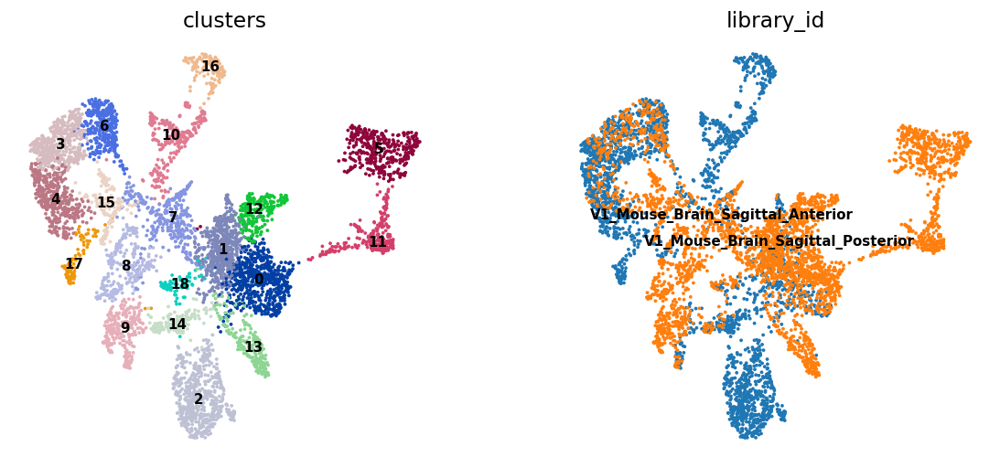

In [17]:
sc.pp.neighbors(adata, use_rep="Scanorama")
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

with plt.rc_context({"figure.figsize": (5, 5)}):
    sc.pl.umap(
        adata,
        color=["clusters", "library_id"],
        legend_loc="on data",
        legend_fontsize="9",
        ncols=2,
        # palette=sc.pl.palettes.default_20,
    )

새로운 클러스터가 추가되었음으로 클러스터 색상에 대한 딕셔너리를 다시 만들어야 합니다.

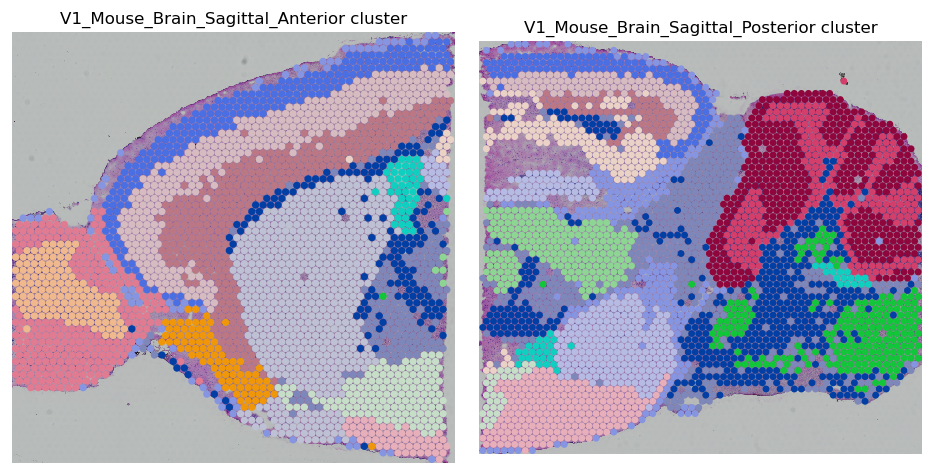

In [18]:
clusters_colors = dict(
    zip(
        [str(i) for i in range(len(adata.obs.clusters.cat.categories))],
        adata.uns["clusters_colors"],
    )
)

fig, axs = plt.subplots(1, 2, figsize=(8, 8))

for i, library in enumerate(library_names):
    ad = adata[adata.obs.library_id == library, :].copy()
    sc.pl.spatial(
        ad,
        img_key="hires",
        library_id=library,
        color="clusters",
        size=1.5,
        palette=[v for k, v in clusters_colors.items() if k in ad.obs.clusters.unique().tolist()],
        legend_loc=None,
        show=False,
        ax=axs[i],
    )
    axs[i].set_title(f"{library} cluster", fontsize=10)

plt.tight_layout()

# 공간적 유전자 변화

조직 내 공간적 위치와 상관관계가 있는 유전자 발현을 식별하는 방법에는 크게 두 가지가 있습니다. 첫 번째는 공간적으로 구분되는 클러스터를 기반으로 DEG를 찾는 것이고, 두번째는 클러스터나 위치를 고려하지 않고 공간적 패턴을 찾는 것입니다. 

먼저 scRNA-seq 데이터에서 했던 것처럼 클러스터 간 DEG를 찾아 보죠.

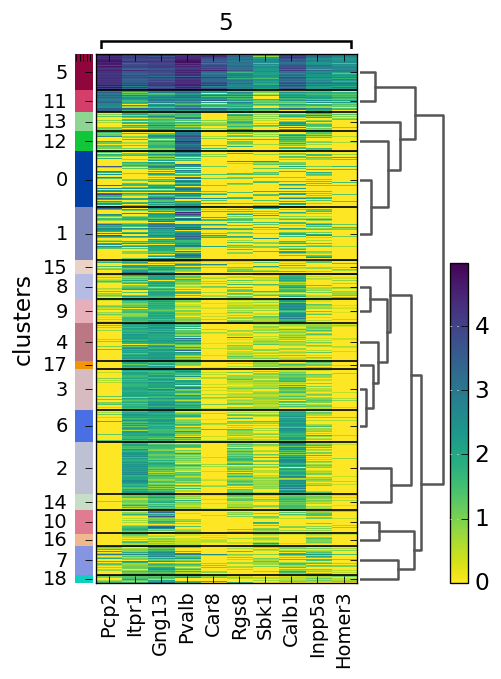

In [19]:
# t-테스트 실행
sc.tl.rank_genes_groups(adata, "clusters", method="wilcoxon")

# Cluster5 유전자에 대한 히트맵으로 플롯
with plt.rc_context({"figure.figsize": (5, 8)}):
    sc.pl.rank_genes_groups_heatmap(adata, groups="5", n_genes=10, groupby="clusters")

V1_Mouse_Brain_Sagittal_Anterior


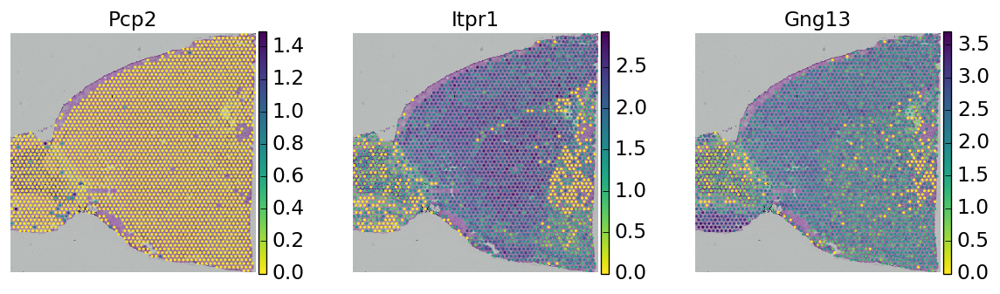

V1_Mouse_Brain_Sagittal_Posterior


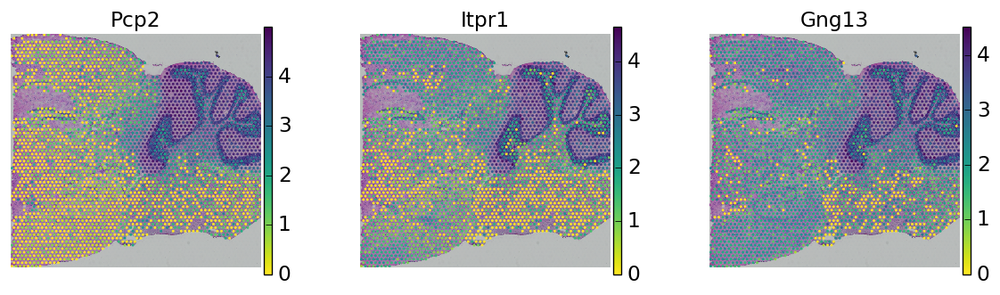

In [20]:
# 공간적 위치에 시각화
top_genes = sc.get.rank_genes_groups_df(adata, group="5", log2fc_min=0)["names"][:3]

for library in library_names:
    print(library)
    sc.pl.spatial(adata[adata.obs.library_id == library, :], library_id=library, color=top_genes)
    ncols = (2,)

연구자들은 유전자 발현 추세가 공간에 따라 어떻게 달라지는지 조사하여 유전자 발현의 공간적 패턴을 파악할 수 있습니다. 공간에 대한 유전자 발현 패턴을 분석하는 도구로는 `SpatailDE`, `SPARK`, `Trendsceek`, `HMRF`, `Splotch`가 있습니다. 여기서는 가우스 프로세스 기반 통계 프레임워크인 `SpatialDE`을 사용해 공간적으로 가변적인 유전자를 식별해봅니다.

:::{.callout-note}
`SpatialDE`를 사용하는 방법은 아래 코드를 참고하세요.

``` {python}
if not fetch_data:
    import NaiveDE
    import SpatialDE
    counts = sc.get.obs_df(adata, keys=list(adata.var_names), use_raw=True)
    total_counts = sc.get.obs_df(adata, keys=["total_counts"])
    norm_expr = NaiveDE.stabilize(counts.T).T
    resid_expr = NaiveDE.regress_out(
        total_counts, norm_expr.T, "np.log(total_counts)").T
    results = SpatialDE.run(adata.obsm["spatial"], resid_expr)
    import pickle
    with open('data/spatial/visium/scanpy_spatialde.pkl', 'wb') as file:
        pickle.dump(results, file)
```

:::

다만 위 코드는 계산량이 많아서 시간이 오래걸립니다. 그래서 미리 계산된 파일을 다음과 같이 제공하니 미리 계산된 파일을 다운로드받아 진행하세요.

In [21]:
path_file = "./input/spatial/visium/scanpy_spatialde.pkl"
if fetch_data and not os.path.exists(path_file):
    import urllib.request

    file_url = os.path.join(path_data, "spatial/visium/results/scanpy_spatialde.pkl")
    urllib.request.urlretrieve(file_url, path_file)

with open("./input/spatial/visium/scanpy_spatialde.pkl", "rb") as file:
    results = pickle.load(file)

In [22]:
# 결과를 변수 주석의 DataFrame인 `adata.var`와 연결합니다.
results.index = results["g"]
adata.var = pd.concat([adata.var, results.loc[adata.var.index.values, :]], axis=1)
adata.write_h5ad("./data/spatial/visium/adata_processed_sc.h5ad")

# 그런 다음 공간에 따라 달라지는 중요한 유전자를 검사하고 `sc.pl.spatial` 함수를 사용하여 시각화할 수 있습니다.
results.sort_values("qval").head(10)

,FSV,M,g,l,max_delta,max_ll,max_mu_hat,max_s2_t_hat,model,n,s2_FSV,s2_logdelta,time,BIC,max_ll_null,LLR,pval,qval
g,,,,,,,,,,,,,,,,,,
Pcp2,0.311857,4,Pcp2,1143.629056,1.942926,-5951.142118,2.926354,0.250801,SE,5749,0.000151,0.003614,0.004486,11936.911361,-6660.401054,709.258937,0.0,0.0
Arpp21,0.111727,4,Arpp21,544.733658,7.705871,-4564.518758,-5.508770,0.234582,SE,5749,0.000009,0.000811,0.004505,9163.664641,-4883.168776,318.650018,0.0,0.0
Fam107b,0.142934,4,Fam107b,544.733658,5.811807,-3153.361188,-0.138821,0.029021,SE,5749,0.000011,0.000676,0.004312,6341.349500,-3593.498319,440.137132,0.0,0.0
Ccdc3,0.089396,4,Ccdc3,544.733658,9.872922,-1973.573273,-1.011429,0.017939,SE,5749,0.000011,0.001366,0.004875,3981.773670,-2119.287504,145.714232,0.0,0.0
Spink8,0.386160,4,Spink8,544.733658,1.540709,-89.582212,-1.292471,0.048386,SE,5749,0.000023,0.000463,0.004225,213.791549,-878.843599,789.261387,0.0,0.0
Vim,0.152102,4,Vim,544.733658,5.403095,-5073.752713,0.314954,0.061191,SE,5749,0.000023,0.001294,0.004482,10182.132550,-5309.926117,236.173404,0.0,0.0
Cdhr4,0.058661,4,Cdhr4,544.733658,15.553480,5174.380569,-0.720568,0.003751,SE,5749,0.000007,0.001779,0.004288,-10314.134013,5055.927174,118.453395,0.0,0.0
Camkv,0.148880,4,Camkv,544.733658,5.540997,-4285.018227,-5.748463,0.267292,SE,5749,0.000011,0.000640,0.004441,8604.663579,-4661.390989,376.372762,0.0,0.0
Pip4k2a,0.057655,4,Pip4k2a,544.733658,15.841994,-4829.402616,0.638928,0.021795,SE,5749,0.000005,0.001414,0.004472,9693.432357,-4950.743568,121.340952,0.0,0.0


# 단일 세포 데이터를 참조해 세포 유형 추정

`Visium` 데이터에서 해당 위치의 세포 유형을 알아내기 위해 scRNA-seq 데이터를 참조할 수 있습니다. 가능하다면 동일한 조직 시료에서 얻은 데이터를 사용하는 것이 좋습니다. 여기에서는 [Allen Institute]()에서 공개한 마우스 대뇌 피질 데이터셋을 사용합니다. 이 데이터셋은 사전 처리된 데이터를 `h5ad`형식으로 제공됩니다. 아래 코드를 사용해 다운로드 합니다.

In [23]:
path_file = "./input/spatial/visium/allen_cortex.h5ad"
if not os.path.exists(path_file):
    file_url = os.path.join(path_data, "spatial/visium/allen_cortex.h5ad")
    urllib.request.urlretrieve(file_url, path_file)

adata_cortex = sc.read_h5ad("./input/spatial/visium/allen_cortex.h5ad")
# 이 객체의 원시 행렬의 인덱스에는 유전자 이름이 없음으로 추가해줍니다.
adata_cortex.raw.var.index = adata_cortex.raw.var._index
# adata_cortex.raw.var.index
adata_cortex

AnnData object with n_obs × n_vars = 14249 × 34617
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample_id', 'sample_type', 'organism', 'donor', 'sex', 'age_days', 'eye_condition', 'genotype', 'driver_lines', 'reporter_lines', 'brain_hemisphere', 'brain_region', 'brain_subregion', 'injection_label_direction', 'injection_primary', 'injection_secondary', 'injection_tract', 'injection_material', 'injection_exclusion_criterion', 'facs_date', 'facs_container', 'facs_sort_criteria', 'rna_amplification_set', 'library_prep_set', 'library_prep_avg_size_bp', 'seq_name', 'seq_tube', 'seq_batch', 'total_reads', 'percent_exon_reads', 'percent_intron_reads', 'percent_intergenic_reads', 'percent_rrna_reads', 'percent_mt_exon_reads', 'percent_reads_unique', 'percent_synth_reads', 'percent_ecoli_reads', 'percent_aligned_reads_total', 'complexity_cg', 'genes_detected_cpm_criterion', 'genes_detected_fpkm_criterion', 'tdt_cpm', 'gfp_cpm', 'class', 'subclass', 'cluster', 'confusion_score', 'cluster

데이터에 포함된 메타데이터도 확인해봅니다.

In [24]:
adata_cortex.obs.head()

,orig.ident,nCount_RNA,nFeature_RNA,sample_id,sample_type,organism,donor,sex,age_days,eye_condition,...,genes_detected_cpm_criterion,genes_detected_fpkm_criterion,tdt_cpm,gfp_cpm,class,subclass,cluster,confusion_score,cluster_correlation,core_intermediate_call
F1S4_160108_001_A01,0,1730700.0,9029,527128530,Cells,Mus musculus,225675,M,53,Normal,...,10445,9222,248.86,248.86,GABAergic,Vip,Vip Arhgap36 Hmcn1,0.4385,0.837229,Intermediate
F1S4_160108_001_B01,0,1909605.0,10207,527128536,Cells,Mus musculus,225675,M,53,Normal,...,11600,10370,289.61,289.61,GABAergic,Lamp5,Lamp5 Lsp1,0.1025,0.878743,Core
F1S4_160108_001_C01,0,1984948.0,10578,527128542,Cells,Mus musculus,225675,M,53,Normal,...,11848,10734,281.06,281.06,GABAergic,Lamp5,Lamp5 Lsp1,0.0195,0.887084,Core
F1S4_160108_001_D01,0,2291552.0,8482,527128548,Cells,Mus musculus,225675,M,53,Normal,...,9494,8561,390.02,390.02,GABAergic,Vip,Vip Crispld2 Htr2c,0.2734,0.843552,Core
F1S4_160108_001_E01,0,1757463.0,8697,527128554,Cells,Mus musculus,225675,M,53,Normal,...,10012,8791,253.92,253.92,GABAergic,Lamp5,Lamp5 Plch2 Dock5,0.7532,0.854994,Core


그런 다음 정규화 및 차원 축소를 실행합니다.

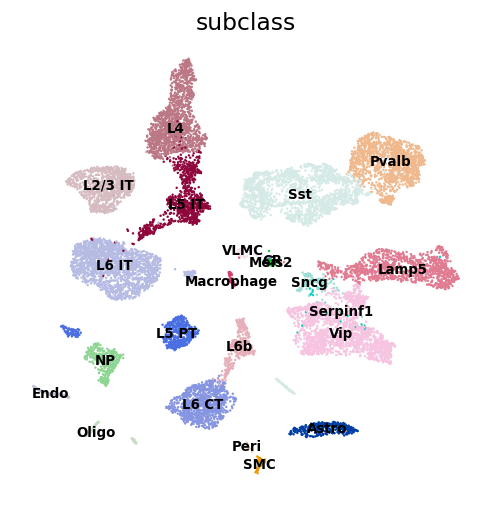

In [25]:
sc.pp.normalize_total(adata_cortex, target_sum=1e5)
sc.pp.log1p(adata_cortex)
sc.pp.highly_variable_genes(adata_cortex, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pp.scale(adata_cortex, max_value=10)
sc.tl.pca(adata_cortex, svd_solver="arpack")
sc.pp.neighbors(adata_cortex, n_pcs=30)
sc.tl.umap(adata_cortex)

with plt.rc_context({"figure.figsize": (5, 5)}):
    sc.pl.umap(
        adata_cortex,
        color="subclass",
        legend_loc="on data",
        legend_fontsize=8,
    )

속도를 높이고 좀 더 견고한 분석을 위해 세포 유형을 클래스당 최대 200개(`subclass`)로 다운 샘플링합니다.

In [26]:
target_cells = 200

adatas2 = [
    adata_cortex[adata_cortex.obs.subclass == clust]
    for clust in adata_cortex.obs.subclass.cat.categories
]

for dat in adatas2:
    if dat.n_obs > target_cells:
        sc.pp.subsample(dat, n_obs=target_cells)

adata_cortex = adatas2[0].concatenate(*adatas2[1:])

adata_cortex.obs.subclass.value_counts()

subclass
Astro         200
L6 IT         200
Sst           200
Pvalb         200
NP            200
Lamp5         200
L6b           200
Vip           200
L6 CT         200
L5 PT         200
L5 IT         200
L4            200
L2/3 IT       200
Sncg          125
Endo           94
Oligo          91
VLMC           67
SMC            55
Macrophage     51
Meis2          45
Peri           32
Serpinf1       27
CR              7
Name: count, dtype: int64

다시 시각화를 해봅니다.

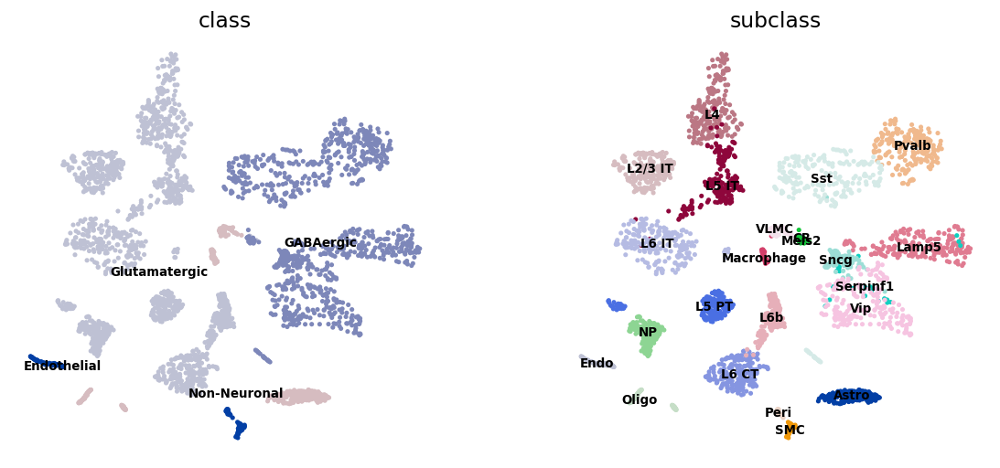

In [27]:
with plt.rc_context({"figure.figsize": (5, 5)}):
    sc.pl.umap(
        adata_cortex,
        color=[
            "class",
            "subclass",
        ],
        palette=sc.pl.palettes.default_28,
        ncols=2,
        legend_loc="on data",
        legend_fontsize=8,
    )

## `Visium` 데이터셋 하위 집합 만들기

불러온 scRNA-seq 데이터는 마우스 대뇌 피질에 대한 것임으로 전체 `Visium` 데이터에서 대뇌 피질에 대한 부분만 분리해 사용합니다. 물론 전체 데이터를 사용해서 분석을 수행할 수 있지만 위양성이 발생할 수 있음으로 주의해서 해석해야 합니다.

디컨볼루션을 위해서는 카운트 데이터가 필요하므로 앞서 생성한 `counts_adata` 객체에서 하위 집합을 만들 것입니다.

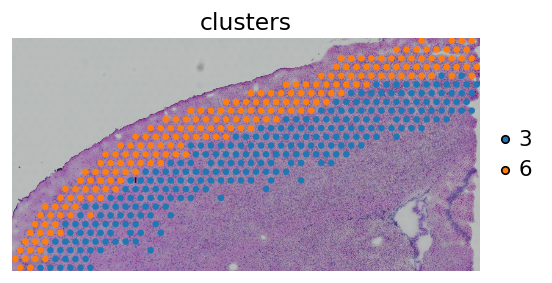

In [28]:
lib_a = "V1_Mouse_Brain_Sagittal_Anterior"

counts_adata.obs["clusters"] = adata.obs.clusters

adata_anterior_subset = counts_adata[
    (counts_adata.obs.library_id == lib_a) & (counts_adata.obsm["spatial"][:, 1] < 6000),
    :,
].copy()

# 대뇌 피질 클러스터 선택
adata_anterior_subset = adata_anterior_subset[
    adata_anterior_subset.obs.clusters.isin(["3", "5", "6"]), :
]

# 올바른 구역만 있는지 확인
with plt.rc_context({"figure.figsize": (5, 5)}):
    sc.pl.spatial(
        adata_anterior_subset,
        img_key="hires",
        library_id=lib_a,
        color=["clusters"],
        # size=1.5,
    )

## 디컨볼루션(Deconvolution)

디컨볼루션은 scRNA-seq 데이터를 사용해 벌크 RNA-seq 데이터셋에서 세포 유형의 비율를 추정하는 방법입니다. `Visium` 데이터도 일종의 작은 벌크 RNA-seq 데이터로 판단할 수 있기에 적용 할 수 있습니다. 디컨볼루션을 하는 방법에는 `DWLS`, `cell2location`, `Tangram`, `Stereo-Seq`, `RCTD`, `SCDC` 등이 알려져 있습니다. 여기서는 `SCVI-tools` 패키지에 구현된 `Stereoscope`을 사용합니다. 자세한 내용은 [깃허브](https://github.com/almaan/stereoscope)를 참조하세요.

### 디컨볼루션을 위한 유전자 선택하기

디컨볼루션 방법을 사용하기 위해서는 사전에 유전자 선택해야 하며 아래와 같은 여러 옵션이 있습니다.

1. `Visium` 데이터에 가변 유전자를 사용.
2. `Visium` 데이터와 scRNAseq 데이터 모두에 가변 유전자 사용.
3. `Visium` 데이터의 클러스터 간에 DE 유전자를 사용.
 
여기서는 scRNAseq 데이터의 클러스터당 상위 DE 유전자를 사용할 것입니다.

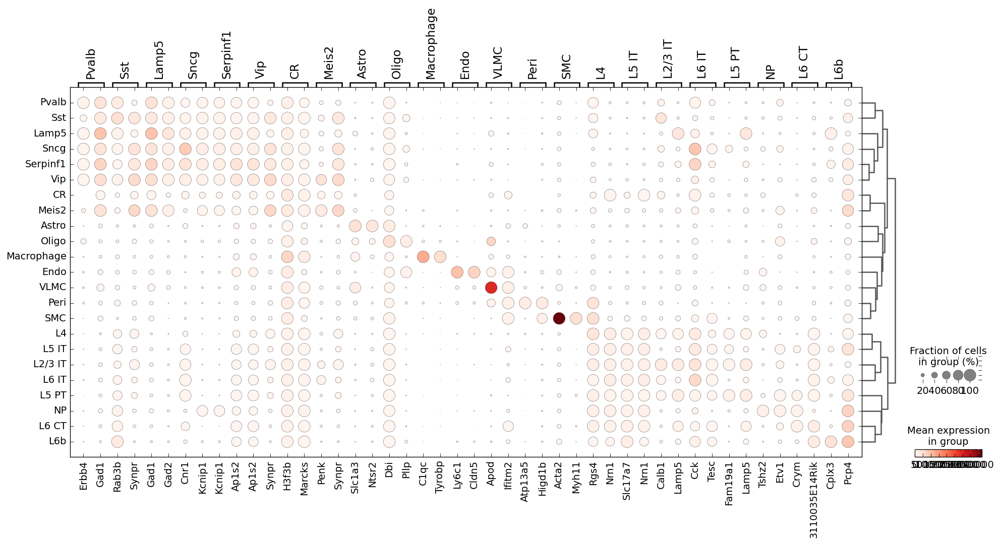

In [29]:
sc.tl.rank_genes_groups(adata_cortex, "subclass", method="t-test", n_genes=100, use_raw=False)

sc.tl.filter_rank_genes_groups(adata_cortex, min_fold_change=1)

genes = sc.get.rank_genes_groups_df(adata_cortex, group=None)
# genes
deg = genes.names.unique().tolist()
# Visium 데이터에도 있는 유전자만 남깁니다.
deg = np.intersect1d(deg, adata_anterior_subset.var.index).tolist()
# print(len(deg))

# dotplot 그리기
sc.pl.rank_genes_groups_dotplot(adata_cortex, n_genes=2)

### 모델 훈련

이제 scRNA-seq 데이터를 사용해 모델을 훈련해보겠습니다. 모든 데이터가 카운트 단위여야 한다는 것에 유의하세요. 또한 `anndata` 객체에 카운트 데이터가 복사본으로 `count` 레이어로 저장되어 있어야 합니다.

An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 4090') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 300/300: 100%|██████████| 300/300 [00:15<00:00, 19.80it/s, v_num=1, train_loss_step=1.38e+7, train_loss_epoch=1.34e+7]

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 300/300: 100%|██████████| 300/300 [00:15<00:00, 19.86it/s, v_num=1, train_loss_step=1.38e+7, train_loss_epoch=1.34e+7]


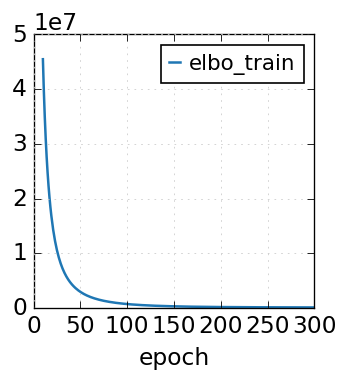

In [30]:
# 카운트 데이터 복사하기
sc_adata = adata_cortex.copy()
sc_adata.X = adata_cortex.raw.X.copy()

# 카운트 레이어 추가
sc_adata.layers["counts"] = sc_adata.X.copy()

# DEG에 속한 유전자로 하위 집합 만들기
sc_adata = sc_adata[:, deg].copy()

# stereoscope 만들기
RNAStereoscope.setup_anndata(sc_adata, layer="counts", labels_key="subclass")

# 모델은 파일에 저장되므로 실행 속도가 느린 경우 train = False를 설정해 로컬에 저장된 모델을 읽습니다.
train = True
if train:
    sc_model = RNAStereoscope(sc_adata)
    sc_model.train(max_epochs=300)
    sc_model.history["elbo_train"][10:].plot()
    sc_model.save("./data/spatial/visium/scanpy_scmodel", overwrite=True)
else:
    sc_model = RNAStereoscope.load("./data/spatial/visium/scanpy_scmodel", sc_adata)
    print("Loaded RNA model from file!")

### 세포 유형 예측하기

먼저 새로운 `Visium` 개체 `st_adata`를 만들고 카운트 데이터를 레이어로 만듭니다.

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 2000/2000: 100%|██████████| 2000/2000 [00:19<00:00, 102.09it/s, v_num=1, train_loss_step=1.11e+6, train_loss_epoch=1.1e+6] 

`Trainer.fit` stopped: `max_epochs=2000` reached.


Epoch 2000/2000: 100%|██████████| 2000/2000 [00:19<00:00, 100.99it/s, v_num=1, train_loss_step=1.11e+6, train_loss_epoch=1.1e+6]


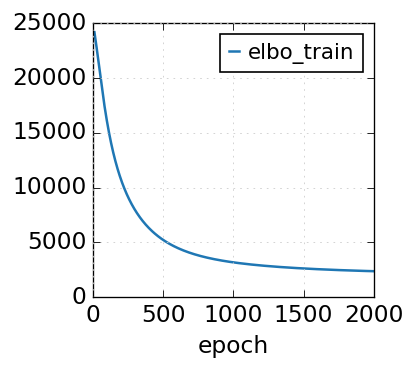

In [31]:
st_adata = adata_anterior_subset.copy()

st_adata.layers["counts"] = st_adata.X.copy()
st_adata = st_adata[:, deg].copy()

SpatialStereoscope.setup_anndata(st_adata, layer="counts")

train = True
if train:
    spatial_model = SpatialStereoscope.from_rna_model(st_adata, sc_model)
    spatial_model.train(max_epochs=2000)
    spatial_model.history["elbo_train"][10:].plot()
    spatial_model.save("./data/spatial/visium/scanpy_stmodel", overwrite=True)
else:
    spatial_model = SpatialStereoscope.load("./data/spatial/visium/scanpy_stmodel", st_adata)
    print("Loaded Spatial model from file!")

이제 scRNA-seq 데이터에서 가져온 세포 유형이 실제로 어떻게 예측되는지 시각화를 통해 살펴봅니다.

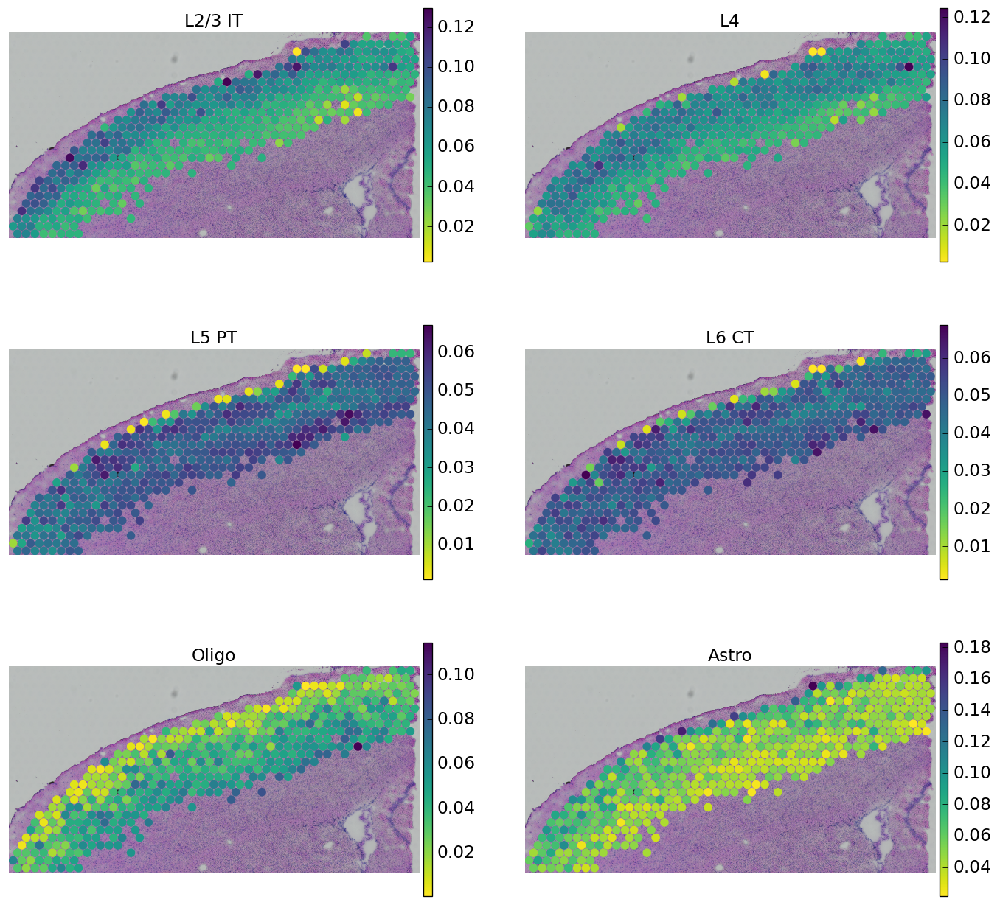

In [32]:
# 모델의 예측 결과를 `.obs` 슬롯에 추가합니다.
st_adata.obsm["deconvolution"] = spatial_model.get_proportions()

# 또한 .obsm에 데이터프레임 추가합니다.
for ct in st_adata.obsm["deconvolution"].columns:
    st_adata.obs[ct] = st_adata.obsm["deconvolution"][ct]


with plt.rc_context({"figure.figsize": (6, 4)}):
    sc.pl.spatial(
        st_adata,
        img_key="hires",
        color=["L2/3 IT", "L4", "L5 PT", "L6 CT", "Oligo", "Astro"],
        library_id=lib_a,
        size=1.5,
        ncols=2,
    )


또한 바이올린 플랏으로 클러스터간 예측된 세포 유형에 대해 시각화해봅니다.


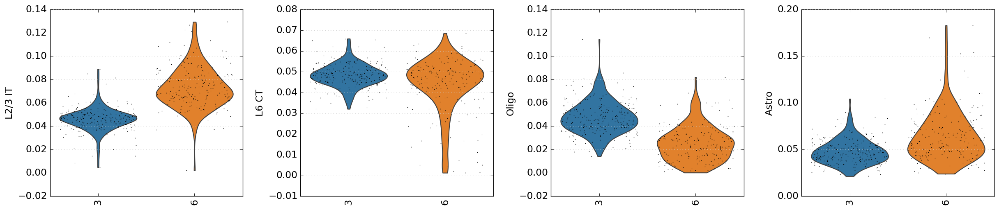

In [38]:
with plt.rc_context({"figure.figsize": (5, 5)}):
    sc.pl.violin(
        st_adata,
        ["L2/3 IT", "L6 CT", "Oligo", "Astro"],
        jitter=0.4,
        groupby="clusters",
        rotation=90,
    )

:::{.callout-note}

디컨볼루션 결과는 예측 결과로 매개변수, 유전자 선택 등을 어떻게 조정하는지에 따라 다른 결과가 나올 수 있습니다. 그러니 항상 검증하는 단계가 필요합니다.

:::

# 다른 구역 선택하기

대뇌피질이 아닌 다른 구역(여기서는 Brain Sagittal Posterior)을 선택하는 코드는 다음과 같습니다. Sagittal Posterior는 신경세포뿐만 아니라 비신경세포로 구성된 부분으로 감각 처리, 운동 조절, 기억 형성 등 다양한 뇌 기능에 중요한 역할을 합니다.


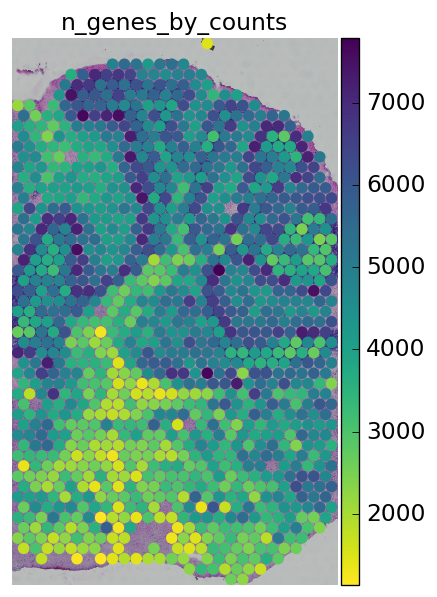

In [35]:
lib_p = "V1_Mouse_Brain_Sagittal_Posterior"

adata_subregion = adata[
    (adata.obs.library_id == lib_p) & (adata.obsm["spatial"][:, 0] > 6500),
    :,
].copy()

with plt.rc_context({"figure.figsize": (4, 6)}):
    sc.pl.spatial(
        adata_subregion,
        img_key="hires",
        library_id=lib_p,
        color=["n_genes_by_counts"],
        size=1.5,
    )

# 나가며

공간 전사체(spatial transcriptomics)는 세포 내 유전자 발현을 조직 내 특정 위치와 연계하여 분석하는 혁신적인 기술로 활발히 발전되고 있습니다. 공간 전사체 데이터가 있으면 조직의 공간적 맥락에서 유전자 활동을 정밀하게 파악할 수 있어 세포 간의 상호작용과 미세 환경의 영향을 포함한 다양한 생물학적 의미를 분석 가능합니다.따라서 앞으로 암 연구 및 신경과학등의 다양한 분야에서 활용될 것으로 보이며 특히 종양의 발병 기작을 이해하고 맞춤형 치료법 개발에 기여할 것으로 예측됩니다.

이것으로 오랫동안 미뤄왔던 Scanpy workshop 시리즈를 마치도록 하겠습니다. 글에 잘못된 부분이나 질문이 있으시다면 메일로 연락주시면 감사하겠습니다.